In [13]:
import numpy as np
import pandas as pd
import cv2
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
from PIL import Image
from ultralytics import YOLO
from inference_sdk import InferenceHTTPClient
from sklearn.preprocessing import StandardScaler
import os



# Funciones auxiliares
def get_center(box):
    x1, y1, x2, y2 = box
    return ((x1 + x2) / 2, (y1 + y2) / 2)

def calculate_distance(c1, c2):
    return np.linalg.norm(np.array(c1) - np.array(c2))

def get_normalized_center(box, img_width, img_height):
    x1, y1, x2, y2 = box
    x_center = ((x1 + x2) / 2) / img_width
    y_center = ((y1 + y2) / 2) / img_height
    return (x_center, y_center)

def normalize_box(box, img_width, img_height):
    x1, y1, x2, y2 = box
    x = x1 / img_width
    y = y1 / img_height
    w = (x2 - x1) / img_width
    h = (y2 - y1) / img_height
    return x, y, w, h

def is_ball_between_player_and_goalpost(player_center, ball_center, goalpost_center, tolerance=1e-6):
    """
    Retorna True si el balón está aproximadamente en la línea que conecta
    al jugador con la portería y está entre ellos (no detrás del jugador).

    Parámetros:
    - player_center, ball_center, goalpost_center: tuplas (x,y) con posiciones normalizadas o absolutas.
    - tolerance: margen para considerar colinealidad.
    """
    p = np.array(player_center)
    b = np.array(ball_center)
    g = np.array(goalpost_center)

    # Vector jugador -> portería
    v_pg = g - p
    # Vector jugador -> balón
    v_pb = b - p

    # Comprobar colinealidad usando producto cruzado (para 2D es escalar)
    cross = np.cross(v_pg, v_pb)
    if abs(cross) > tolerance:
        return False  # No están alineados

    # Comprobar que balón está entre jugador y portería usando producto punto
    dot = np.dot(v_pg, v_pb)
    if dot < 0:
        return False  # Balón está detrás del jugador

    # Comprobar que balón no está más allá de la portería
    if np.linalg.norm(v_pb) > np.linalg.norm(v_pg):
        return False  # Balón está más allá de la portería (no típico, pero por seguridad)

    return True

class Dataset:
    """
    Clase para procesar imágenes y extraer embeddings útiles para análisis de probabilidad de gol
    a partir de los datos de los jugadores, balón y portería detectados por los modelos YOLO.
    """

    def __init__(self, input_folder, model_path, client_api_url, client_api_key, goalpost_model_id):
        """
        Inicializa la clase con los modelos YOLO y cliente para inferencia de la portería.
        """
        self.input_folder = input_folder
        self.model = YOLO(model_path)
        self.client = InferenceHTTPClient(api_url=client_api_url, api_key=client_api_key)
        self.goalpost_model_id = goalpost_model_id
        self.frames_embeddings = []
        self.frames_results = {}  # Diccionario para almacenar los resultados por frame

    def get_bounding_boxes(self, frame):
        """
        Ejecuta el modelo YOLO sobre una imagen para obtener las cajas de los jugadores y el balón.
        """
        results = self.model(frame)[0]
        boxes = results.boxes.xyxy.cpu().numpy()
        classes = results.boxes.cls.cpu().numpy().astype(int)
        confs = results.boxes.conf.cpu().numpy()
        return boxes, classes, confs

    def get_goalpost_coordinates(self, frame):
        """
        Ejecuta el cliente para obtener las coordenadas de la portería desde el modelo de Roboflow.
        """
        try:
            results = self.client.infer(frame, model_id=self.goalpost_model_id)["predictions"]
            if not results:
                return 0, 0, 0, 0  # Si no se detecta la portería, retorna coordenadas nulas.
            result = results[0]
            x0 = result["x"] - result["width"] / 2
            y0 = result["y"] - result["height"] / 2
            x1 = result["x"] + result["width"] / 2
            y1 = result["y"] + result["height"] / 2
            conf = result.get('confidence', 0)  # Usar la probabilidad de detección de la portería
            return x0, y0, x1, y1, conf  # Retornamos la confianza de la portería
        except HTTPCallErrorError as e:
            print(f"Error en inferencia Roboflow: {e}. Reintentando ({attempt+1}/{retries})...")
            
    def calculate_embedding(self, frame, boxes, classes, confs):
        """
        Calcula el embedding de la imagen basado en la probabilidad de detección de balón, la distancia 
        entre el jugador más cercano y el balón, y la probabilidad de detección de portería.
        """
        height, width = frame.shape[:2]

        players = [box for box, cls in zip(boxes, classes) if cls == 0]
        balls_info = [(box, conf) for box, cls, conf in zip(boxes, classes, confs) if cls == 32]

        # Inicializar valores por defecto
        ball_conf = -1e8
        ball_x = ball_y = ball_w = ball_h = -1
        min_dist = -1e8 

        if balls_info:
            ball_box, ball_conf = balls_info[0]  # usar la más confiable
            ball_center = get_normalized_center(ball_box, width, height)
            ball_x, ball_y, ball_w, ball_h = normalize_box(ball_box, width, height)

            if players:
                dists = []
                for player in players:
                    if is_ball_between_player_and_goalpost(get_center(player), ball_center, get_center(ball_box)):
                        player_center = get_normalized_center(player, width, height)
                        dist = calculate_distance(ball_center, player_center)
                        dists.append(dist)
                    else:
                        # Si el balón no está entre el jugador y la portería, asignar una distancia negativa
                        continue 
                min_dist = min(dists) if dists else -1000000

        # Obtener la probabilidad de detección de la portería
        goalpost_coords = self.get_goalpost_coordinates(frame)
        goalpost_prob = goalpost_coords[4] if len(goalpost_coords) > 4 else -1e8 # Usar la confianza de la portería

        # Embedding: (probabilidad balón, distancia jugador-balon, probabilidad portería)
        embedding = (ball_conf, min_dist, goalpost_prob)

        # Validar si el embedding tiene valores válidos (sin NaN ni Inf)
        if any(np.isnan(val) or np.isinf(val) for val in embedding):  # Cambié la condición para iterar sobre los valores individuales
            return None  # Si hay un NaN o Inf, no procesamos este embedding

        return embedding

    def process_frame(self, frame_path):
        """
        Procesa un frame y obtiene su embedding.
        """
        frame = cv2.imread(frame_path)
        if frame is None:
            return None

        # Obtener las cajas de los jugadores y el balón
        boxes, classes, confs = self.get_bounding_boxes(frame)

        # Calcular el embedding
        embedding = self.calculate_embedding(frame, boxes, classes, confs)

        if embedding is not None:
            self.frames_embeddings.append(embedding)
            return embedding
        return None

    def process_dataset(self):
        """
        Procesa todas las imágenes del dataset y calcula los embeddings.
        """
        for filename in os.listdir(self.input_folder):
            frame_path = os.path.join(self.input_folder, filename)
            self.process_frame(frame_path)

    def apply_kmeans(self, n_clusters=2):
        """
        Aplica KMeans a los embeddings calculados y devuelve los clusters.
        """
        if len(self.frames_embeddings) == 0:
            raise ValueError("No se han calculado embeddings. Por favor, procese el dataset primero.")

        embeddings = np.array(self.frames_embeddings)
        
        # Validar si los embeddings contienen valores NaN o Inf
        if np.any(np.isnan(embeddings)) or np.any(np.isinf(embeddings)):
            print("¡Atención! Hay embeddings con valores inválidos (NaN o Inf). Limpiando los datos.")
            embeddings = embeddings[np.isfinite(embeddings).all(axis=1)]  # Eliminar los embeddings inválidos

        # Escalado de las características
        scaler = StandardScaler()
        embeddings_scaled = scaler.fit_transform(embeddings)

        # Aplicar KMeans
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        kmeans.fit(embeddings_scaled)

        # Obtener los labels de los clusters
        labels = kmeans.labels_

        # Guardar el resultado en el diccionario con el nombre del frame y su etiqueta de cluster
        for idx, filename in enumerate(os.listdir(self.input_folder)):
            self.frames_results[filename] = labels[idx]

        return labels


In [14]:

dataset = Dataset(
    input_folder="./Frames_finals_Def/Frames_finals/proves", 
    model_path="./yolov8x.pt",
    client_api_url="https://serverless.roboflow.com",
    client_api_key="rBdH252WboGgmvJFVPES",
    goalpost_model_id="goalpost-u6e0h/1"
)

dataset.process_dataset()
labels = dataset.apply_kmeans(n_clusters=2)

print(dataset.frames_results)



0: 384x640 14 persons, 38.4ms
Speed: 2.0ms preprocess, 38.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 persons, 1 sports ball, 35.4ms
Speed: 3.3ms preprocess, 35.4ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 16 persons, 35.0ms
Speed: 3.0ms preprocess, 35.0ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 persons, 1 sports ball, 35.1ms
Speed: 3.0ms preprocess, 35.1ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 persons, 1 sports ball, 34.6ms
Speed: 1.4ms preprocess, 34.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 persons, 34.8ms
Speed: 1.5ms preprocess, 34.8ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 persons, 35.1ms
Speed: 2.9ms preprocess, 35.1ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 persons, 35.5ms
Speed: 2.5ms preprocess, 35.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 persons, 35.2ms
Speed: 2.8ms preprocess, 35.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 persons, 35.7ms
Speed: 2.8ms preprocess, 35.7ms inference, 

YILPKKpkVV9THrGsFkT2

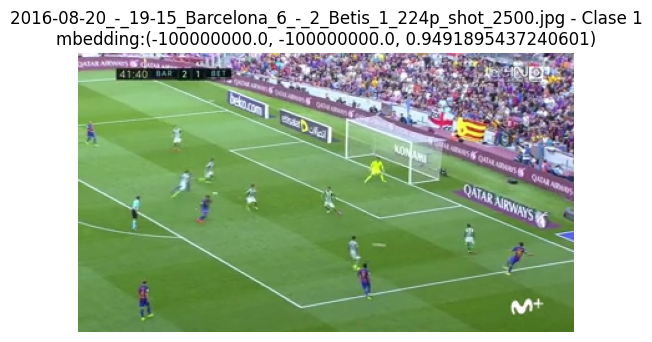

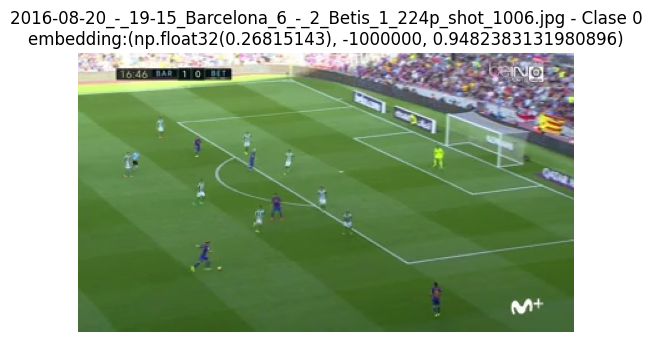

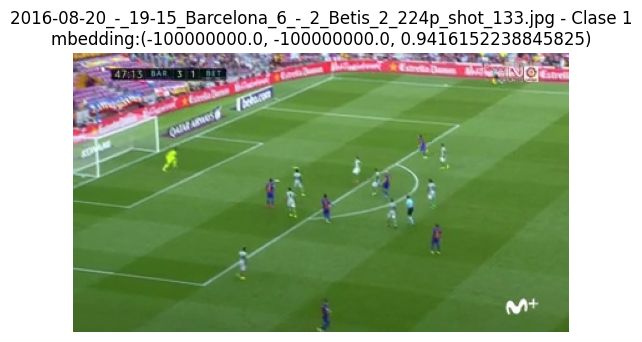

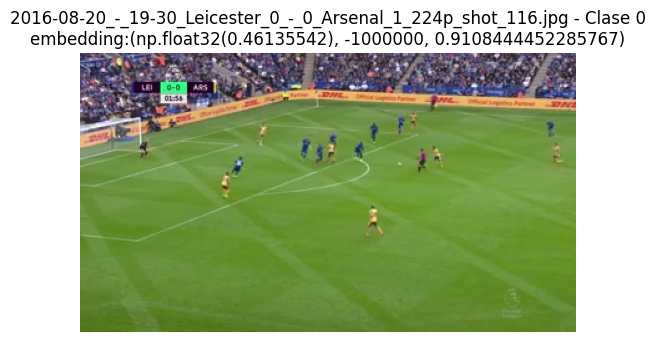

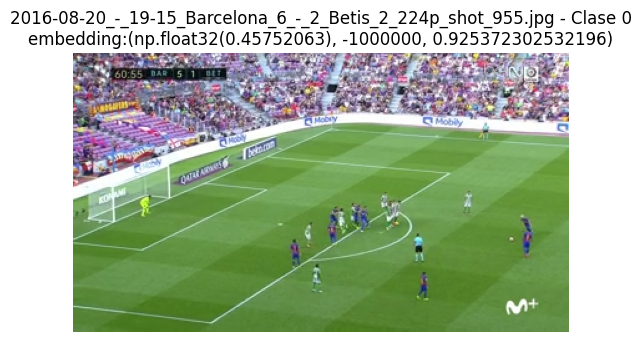

...

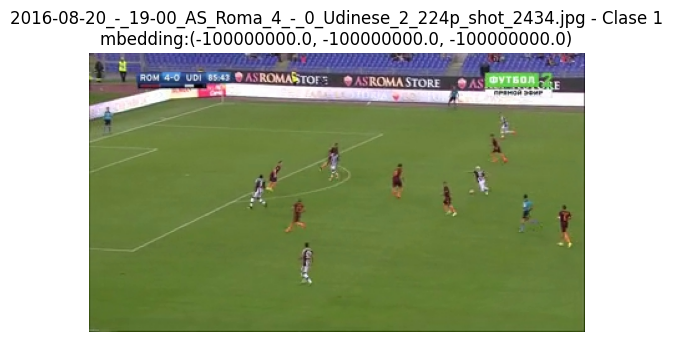

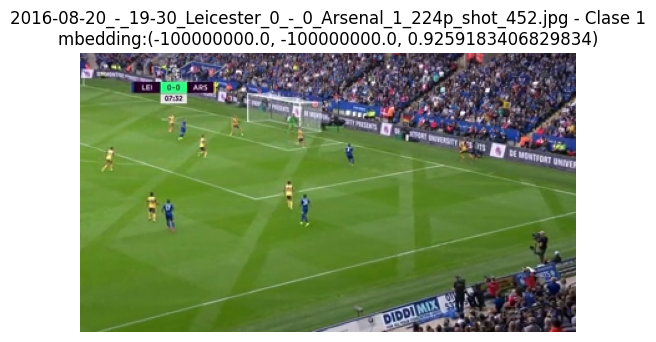

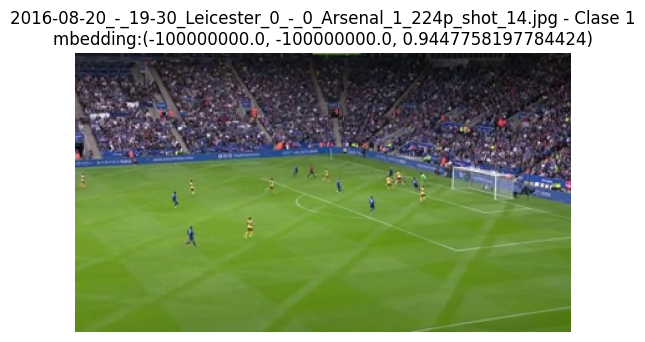

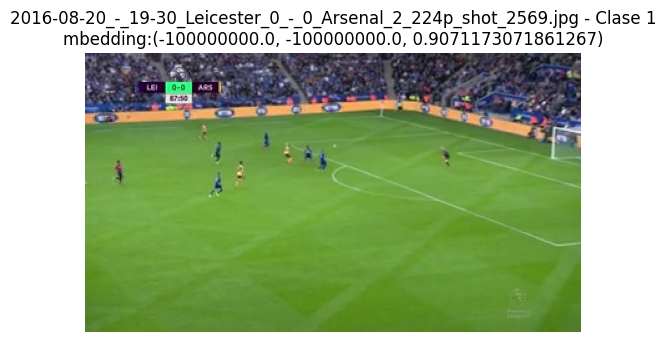

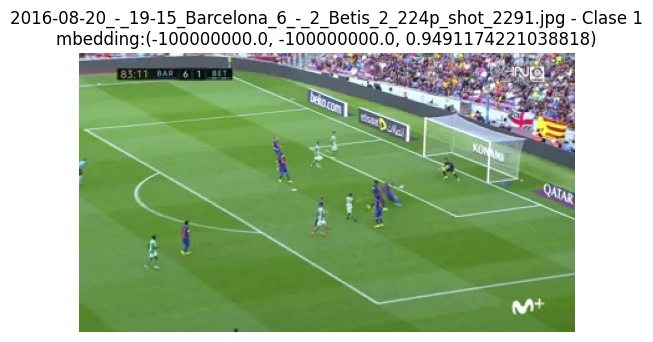

In [15]:
import os
import cv2
import matplotlib.pyplot as plt

cluster1 = []
cluster2 = []

# Clasificar los archivos en los clusters
for k, v in dataset.frames_results.items():
    if v == 0:
        cluster1.append(k)
    else:
        cluster2.append(k)

input_folder = "./Frames_finals_Def/Frames_finals/proves"

# Iterar sobre los archivos en la carpeta
for filename in os.listdir(input_folder):
    # Comprobar si el archivo está en uno de los clusters
    if filename in cluster1 or filename in cluster2:
        file_path = os.path.join(input_folder, filename)
        image = cv2.imread(file_path)

        # Convertir la imagen de BGR a RGB (porque OpenCV lee las imágenes en BGR)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Obtener el embedding correspondiente para la imagen
        # Buscar el embedding que corresponde a este archivo en frames_results
        embedding_idx = list(dataset.frames_results.keys()).index(filename)
        embedding = dataset.frames_embeddings[embedding_idx]

        # Extraer los valores del embedding
        ball_conf, min_dist, goalpost_prob = embedding

        # Mostrar la imagen
        plt.imshow(image_rgb)
        plt.axis('off')  # No mostrar los ejes
        
        # Título con el nombre del archivo, clase y valores del embedding
        if filename in cluster1:
            plt.title(f"{filename} - Clase 0\nembedding:{embedding}")
        else:
            plt.title(f"{filename} - Clase 1\nmbedding:{embedding}")
        
        plt.show()
